# Landslide Runout Animation

#### Simulate the runout extent, sediment transport and topographic change caused by a large landslide and its runout in the Cascade Mountains, WA, USA

In this tutorial, the user models the runout of a large landslide (initial landslide volume = 110,000 $m^3$) that occurred south of Mount St. Helens in Washington State in 2009. The landslide initiated in  hydrothermally altered basaltic andesite and epiclastic sandstone. In many areas, this rock is weathered to clay and rippable with a hand shovel. The initial landslide depth extended 5 to 10 m into this weak rock. After initiation, the landslide flowed downslope as an unconfined debris avalanche, eroding and depositing as it traveled. Roughly 29% of the total mobilized volume (initial landslide + erosion) was derived from erosion during the runout.

To model landslide runout at this site using MassWastingRunout (MWR), you will load a pre-event DEM, the landslide source area and a regolith thickness map and define MWR parameters. Try to pick the parameters values that best match observed runout extent, erosion and deposition caused by the enlargement.

<div align="center">
   <img src = attachment:066c5064-15a6-4d7a-9bbe-eb1783808250.JPG width="500"/>
<div>
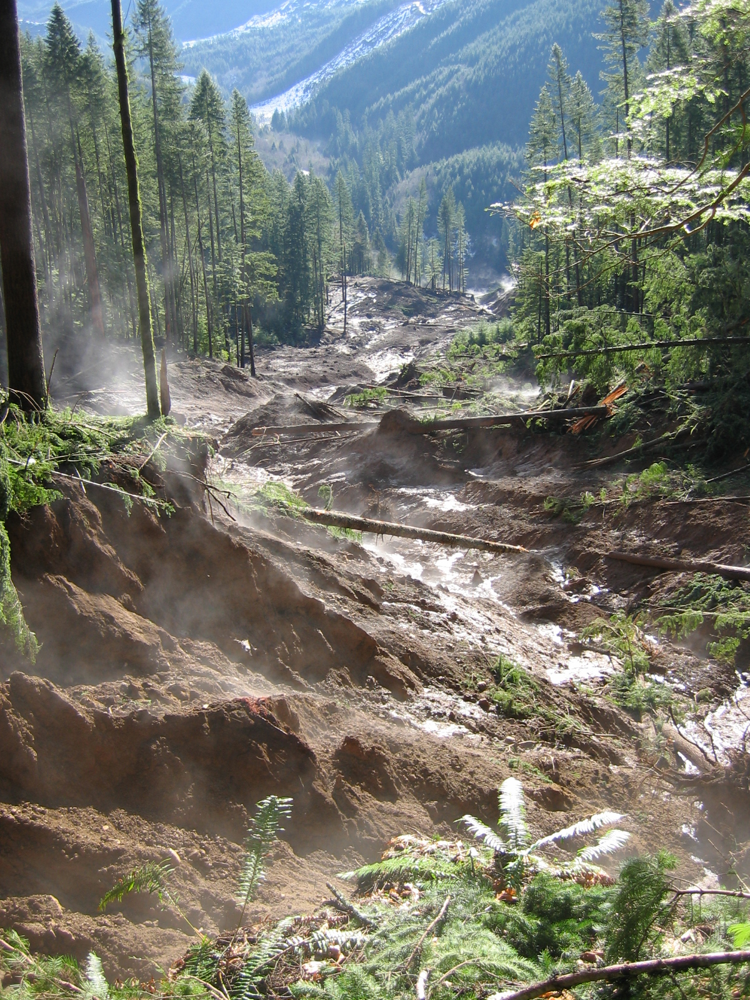

## Model overview
- MWR models the downslope progression of mass wasting processes such as debris flows or dry debris avalanches.

- Mass continuity is central to model conceptualization; at any node, the incoming flux (q_I), erosion (E) and aggradation (A) determine outgoing flux (q_O) and ultimately the runout extent and how the landscape evolves. 

<div>
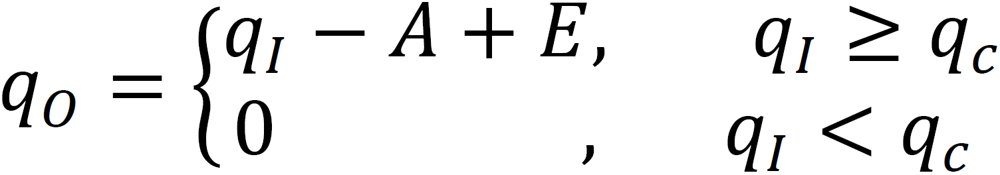
<div>    

- MWR uses a set of rules and algorithms to numerically represent the release of the mass wasting source material and erosion, deposition and vegetation/debris impacts on the runout process as illustrated below:

<div align="center">
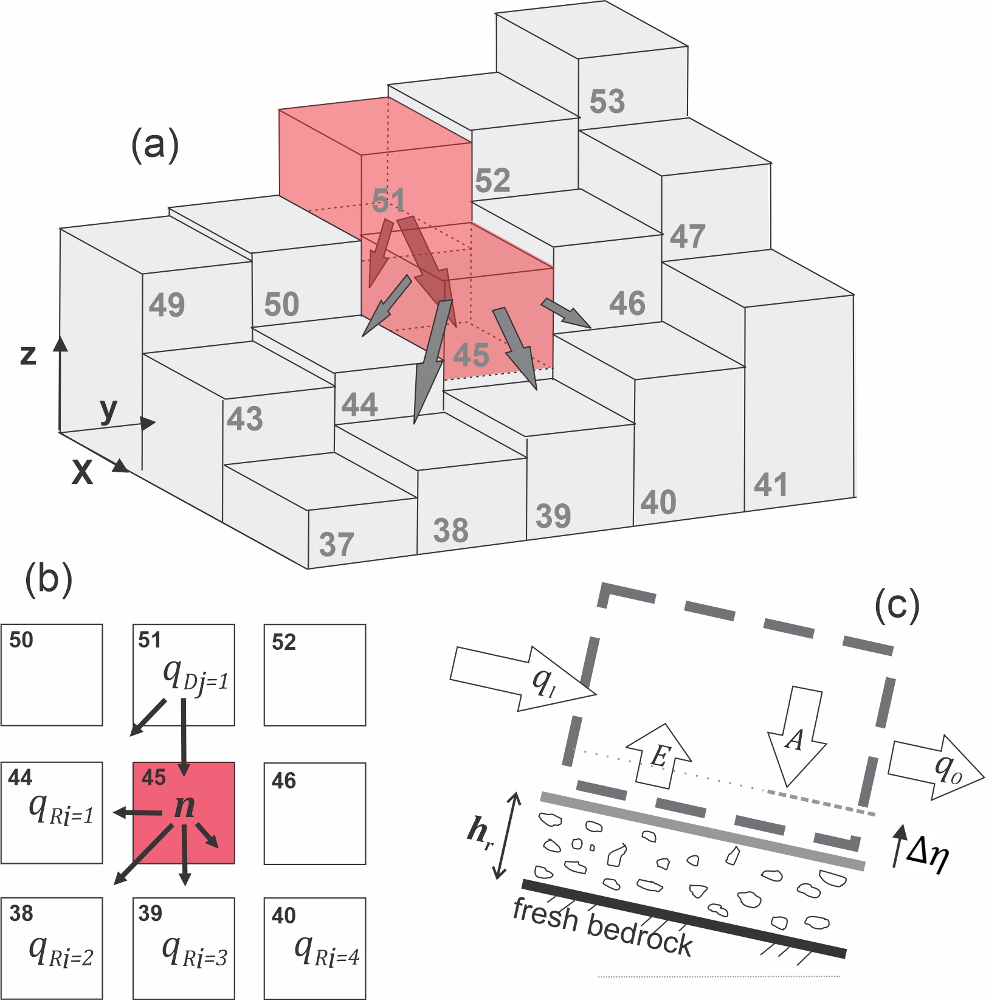
<div>

<strong><em>(a)</em></strong> Release of the initial mass wasting source material nodes (represented by red cells); <strong><em>(b)</em></strong> How q_O at node n (n = 45) is distributed downslope after incoming material q_I (here equal to flux from node 51) has aggraded (A) or eroded (E) node n; <strong><em>(c)</em></strong> Mass continuity determines the change in regolith thickness/topographic elevation. For a full description of the above parameters, see Keck et al. (2024). 

**To begin, first import  packages and components necessary to load MWR inputs, run MWR and visualize model results.**

In [1]:
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib.pyplot as plt
import numpy as np

from landlab.components import (
    DepressionFinderAndRouter,
    FlowAccumulator,
    FlowDirectorMFD,
)
#from landlab.components.mass_wasting_runout import MassWastingRunout # use this if you don't have a copy of mass_wasting_runout_vectorized
from mass_wasting_runout_vectorized import MassWastingRunout
from landlab.io import esri_ascii

**Next, define key MWR parameters S_c, q_c and k and attributes to be tracked by the model.**

In MWR, S_c is a critical slope constraint. For some flows, it may be possible to approximate S_c from the surface slope of observed deposits. The parameter q_c is the threshold flux for deposition, that conceptually represents the flow depth below which flow resistance is large enough to cease the forward momentum of the flow, whether in the form of frictional resistance along the base of the flow or debris and vegetation in the path of the flow. Parameter k scales the erosion rate.<br>

Try different S_c and q_c values to best match modeled runout to observed runout. Notebook 3 will show how to use the MWR calibrator utility to atuomate this process.

In [2]:
# Model parameters, determined through calibration using the MWR Calibrator utility
S_c = [0.02]# [0.04679]
q_c = 0.1# 0.18302  # m

# Model parameters, determined from field and DoD
k =  0.0205
typical_flow_thickness_of_erosion_zone = 4  # m
typical_slope_of_erosion_zone = 0.25
max_flow_depth_observed_in_field = 10  # m
Dp = 0.316  # m

# regolith and runout material attributes that will be tracked
tracked_attributes = ["particle__diameter"]

**Next, define the initial model terrain and lanslide location and depth.**

Below, the initial DEM, a regolith depth map and the location and depth of the mass wasting source material (e.g., landslide body) are defined. In this example, the required inputs have been prepared using an external GIS system. The initial DEM was created after the 2009 landslide but before the 2021 enlargement. Over most of the model domain, regolith depth is assumed uniform and equal to 1.2 meters. At the lanslide, bedrock is hydrothermally altered and the regolith is much deeper. Regolith depth at the landslide was estimated by subtracting a DEM recorded after the 2021 failure from the initial DEM. The intial landslide source area was mapped from airphotos of the event. We also load a high-resolution hillshade of the model domain that will be used for visualizing model results.

In [3]:
# GIS generated inputs
DEM_pre = "pre-runout_DEM_CM2009.asc"
DEM_pre_hs = "pre-runout_DEM_highres_hillshade_CM2009.asc"
lsnodes = "landslide_nodes_CM2009.asc"
DoDo = "observed_DoD_CM2009.asc"
ls_depth = "landslide_depth_CM2009.asc"

# dem
with open(DEM_pre) as fp:
    mg = esri_ascii.load(fp, name="topographic__elevation", at="node")
z = mg.at_node["topographic__elevation"]

# ls nodes
with open(lsnodes) as fp:
    esri_ascii.load(fp, name="mass__wasting_id", at="node", out=mg)
mg.at_node["mass__wasting_id"] = mg.at_node["mass__wasting_id"].astype(int)

# observed DoD
with open(DoDo) as fp:
    esri_ascii.load(fp, name="dem_dif_o", at="node", out=mg)

# change null values to zero
mg.at_node["dem_dif_o"][mg.at_node["dem_dif_o"] == -9999] = 0

# create a modeled DoD field, to be updated later to show animation of modeled DoD
mg.at_node["dem_dif_m"] = np.zeros(mg.number_of_nodes)

# soil depth
# here using uniform depth of 4 meters #1.2 meters
depth = np.ones(mg.number_of_nodes) * 4
mg.add_field("soil__thickness", depth, at="node")

# set landslide thickness (depth), here defined based on field and remote sensing interpretation of the landslide scar.
# mw_id = 1 # values in lsnodes
# lsnode_y = mg.node_y[mg.at_node['mass__wasting_id'] == mw_id]
# ymin = lsnode_y.min()
# yd = lsnode_y-ymin
# lsd = 1.75+(9/200)*yd # roughly 3 m at downslope edge and 12 m at upslope edge
# mg.at_node['soil__thickness'][mg.at_node['mass__wasting_id'] == mw_id] = lsd

# high res hillshade for plot background
with open(DEM_pre_hs) as fp:
    mg_hs = esri_ascii.load(fp, name="hillshade_arc", at="node")
mg_hs.at_node["hillshade_arc"][mg_hs.at_node["hillshade_arc"] == -9999] = np.nan

# finds lowest point in dem and sets it as an open node

mg.set_watershed_boundary_condition(z)

# add particle diameter
# representative grain size of regolith
mg.at_node["particle__diameter"] = np.ones(len(mg.node_x)) * Dp

# flow accumulater to get contributing area to each grid cell. We initially use the FlowDirectorD8 option
# to visualize topographic slope but will replace the flow router with the MFD option later in this notebook
# because MWR uses the multi-directional slope.
fa = FlowAccumulator(mg, "topographic__elevation", flow_director="FlowDirectorD8")
fa.run_one_step()

# fill depressions to correct surface area determination
df_4 = DepressionFinderAndRouter(mg)
df_4.map_depressions()

# save a copy of the initial elevation for dem differencing
_ = mg.add_field(
    "topographic__initial_elevation",
    mg.at_node["topographic__elevation"],
    at="node",
    copy=True,
)

In [4]:
#compute drainage area at node for modeled
dr_ar = mg.at_node['drainage_area'][mg.core_nodes]
a_i = dr_ar
s_i = mg.at_node['topographic__steepest_slope'][mg.core_nodes]

**Before we instantiate and run the model, lets visualize some of the loaded inputs to get a feel for the landslide geometry relative to the terrain.**

First we need to define a few functions for visualizing model results.<br>
These functions are not necessary to run the model.

In [5]:
def plot_node_field_with_shaded_high_res_dem(
    mg,
    mg_hs,
    field,
    save_name=None,
    plot_name=None,
    figsize=(7, 7),
    cmap="terrain",
    fontsize=10,
    alpha=0.5,
    cbr=None,
    norm=None,
    allow_colorbar=True,
    colorbar_label=None,
    var_name=None,
    var_units=None,
    domain_buffer=0,
    **kwds,
):
    if plot_name is None:
        plt.figure(field, figsize=figsize)
    else:
        plt.figure(plot_name, figsize=figsize)

    mg_hs.imshow(
        "hillshade_arc",
        cmap="Greys_r",
        grid_units=("coordinates", "coordinates"),
        shrink=0.75,
        var_name=None,
        var_units=None,
        output=None,
        allow_colorbar=False,
        color_for_background="white",
        color_for_closed="white",
        limits=(0, 360),
    )
    mg.imshow(
        field,
        cmap=cmap,
        grid_units=("coordinates", "coordinates"),
        shrink=0.75,
        var_name=var_name,
        var_units=var_units,
        alpha=alpha,
        output=None,
        color_for_closed=None,
        color_for_background=None,
        norm=norm,
        allow_colorbar=allow_colorbar,
        colorbar_label=colorbar_label,
    )

    plt.xlim(
        [
            mg.x_of_node[mg.core_nodes].min() - 20,
            mg.x_of_node[mg.core_nodes].max() + domain_buffer,
        ]
    )
    plt.ylim(
        [
            mg.y_of_node[mg.core_nodes].min() - 20,
            mg.y_of_node[mg.core_nodes].max() + domain_buffer,
        ]
    )

    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    if cbr is None:
        r_values = mg.at_node[field][mg.core_nodes]
        plt.clim(r_values.min(), r_values.max())
    else:
        plt.clim(cbr[0], cbr[1])

    if save_name is not None:
        plt.savefig(save_name + ".png", dpi=300, bbox_inches="tight")


def get_values_xy(grid, field):
    # convert grid array to input for pcolormesh (from imshow_grid)
    values = grid.at_node[field]
    values = values.reshape(grid.shape)
    y = (
        np.arange(values.shape[0] + 1) * grid.dy
        - grid.dy * 0.5
        + grid.xy_of_lower_left[1]
    )
    x = (
        np.arange(values.shape[1] + 1) * grid.dx
        - grid.dx * 0.5
        + grid.xy_of_lower_left[0]
    )
    return x, y, values


# plotting function
def color_mesh_vals(clim=[-1, 1]):
    x, y, values = get_values_xy(mg, "dem_dif_m")
    myimage = plt.pcolormesh(x, y, values, cmap="bwr", alpha=0.5)
    myimage.set_rasterized(True)
    myimage.axes.set_aspect("equal")
    plt.autoscale(tight=True)
    plt.clim(clim)
    return myimage

As noted above, the landslide is an enlargement of an existing landslide scar that formed in 2009. Downslope of the 2009 scar, a first-to-second order channel drains the center of the 2009 runout path and two forest roads cross the channel. Both road crossing were destroyed by the 2009 runout but were later reconstructed and are large fills that effectively create check dams in the runout path of the 2021 landslide. Note the model is run using a 10-meter grid but for visualization purposes, we show model inputs and results overlayed on top of a high-resolution (2-meter) hillshade of the terrain.

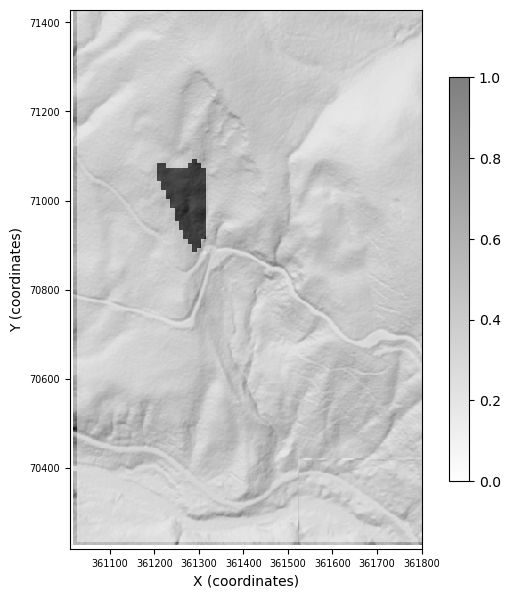

In [6]:
plot_node_field_with_shaded_high_res_dem(
    mg, mg_hs=mg_hs, field="mass__wasting_id", cmap="binary", cbr=[0, 1], fontsize=7
)

In the next figure, we plot topographic slope of the initial DEM. At high slopes, MWR will erode while at low slopes MWR will deposit, where high and low vary as a function of the parameter S_c. You can see that there is an area of moderate-to-low slope (green and blue cells) between the two roads.

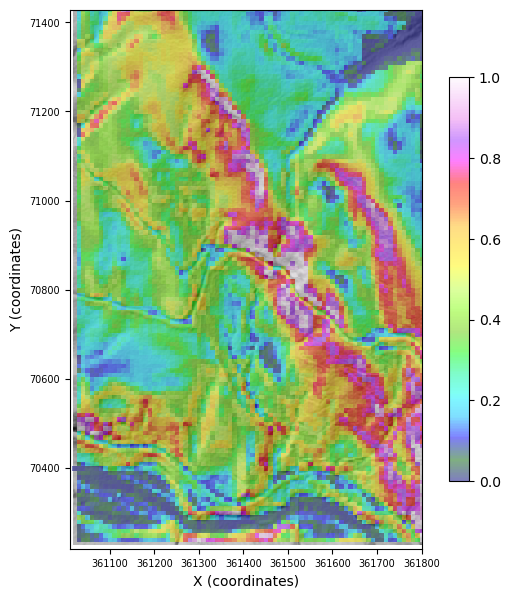

In [7]:
plot_node_field_with_shaded_high_res_dem(
    mg=mg,
    mg_hs=mg_hs,
    field="topographic__steepest_slope",
    cmap="gist_ncar",
    cbr=[0, 1],
    fontsize=7,
)

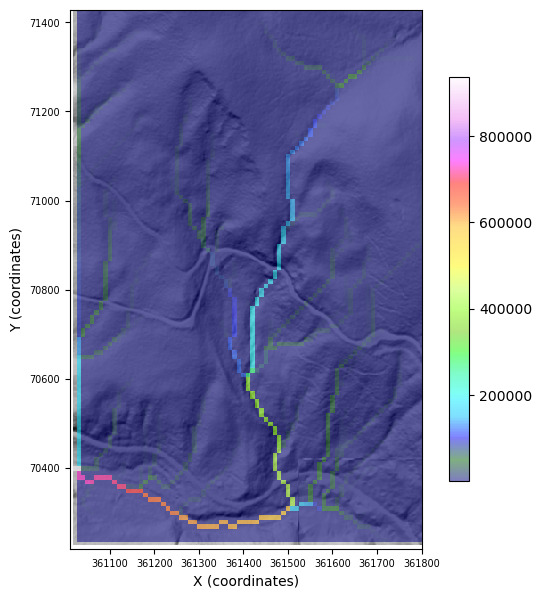

In [8]:
plot_node_field_with_shaded_high_res_dem(
    mg=mg,
    mg_hs=mg_hs,
    field='drainage_area',
    cmap="gist_ncar",
    #cbr=[0, 1],
    fontsize=7,
)


We calibrated MWR to a DoD of the observed runout (shown below). Red indicates a positive change in the elevation of the terrain (aggradation) and blue indicates a negative change (erosion). Notice how the observed runout eroded along the steep reaches and deposited in the moderate to low slope reaches. It also formed thick deposits up-channel of the road crossings. It eroded the upper road surface but not the surface of the lower road. Only a small amount of the observed runout actually flowed into the river at the base of the hillslope.

In [9]:
mg.at_node.keys()

['topographic__elevation',
 'mass__wasting_id',
 'dem_dif_o',
 'dem_dif_m',
 'soil__thickness',
 'particle__diameter',
 'water__unit_flux_in',
 'drainage_area',
 'flow__data_structure_delta',
 'flow__upstream_node_order',
 'surface_water__discharge',
 'flow__sink_flag',
 'flow__link_to_receiver_node',
 'flow__receiver_node',
 'topographic__steepest_slope',
 'depression__depth',
 'depression__outlet_node',
 'is_pit',
 'flood_status_code',
 'topographic__initial_elevation']

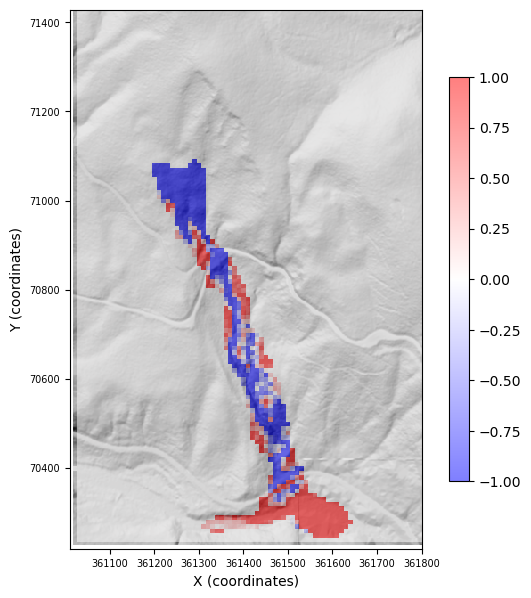

In [10]:
plot_node_field_with_shaded_high_res_dem(
    mg, mg_hs=mg_hs, field="dem_dif_o", cmap="bwr", alpha=0.5, cbr=[-1, 1], fontsize=7
)

E_mask = mg.at_node["dem_dif_o"]<0
E_area = E_mask.sum()*mg.dx*mg.dy
E_mean = mg.at_node["dem_dif_o"][E_mask].mean()
A_mask = mg.at_node["dem_dif_o"]>0
A_area = A_mask.sum()*mg.dx*mg.dy
A_mean = mg.at_node["dem_dif_o"][A_mask].mean()

In [11]:
print('Observed mean erosion depth of {} m over an area of {} m^2 and a total erosion volume of {} m^3'.format(np.round(E_mean, decimals = 2), E_area, np.round(E_mean*E_area, decimals = 2)))
print('Observed mean aggradation depth of {} m over an area of {} m^2 and a total aggradation volume of {} m^3'.format(np.round(A_mean,decimals = 2), A_area, np.round(A_mean*A_area, decimals = 2)))

Observed mean erosion depth of -3.43 m over an area of 41400.0 m^2 and a total erosion volume of -142205.71 m^3
Observed mean aggradation depth of 1.24 m over an area of 37300.0 m^2 and a total aggradation volume of 46388.95 m^3


<em> Note, the discrepency between erosion and deposition volume is because much of the 2009 deposit in the river valley was eroded after the event and no
longer present in the post-landslide DEM.


**Now set up an instance of MWR using the newly defined raster model grid and the landslide and watch a calibrated recreation of the observed runout!**

Before we instantiate the model, we need to switch the topographic__steepest_slope and other related flow routing fields from the D8 flow routing option to the multidirectional routing option. MWR uses multi-directional slope. 

In [12]:
# delete d8 flow direction
mg.delete_field(loc="node", name="flow__sink_flag")
mg.delete_field(loc="node", name="flow__link_to_receiver_node")
mg.delete_field(loc="node", name="flow__receiver_node")
mg.delete_field(loc="node", name="topographic__steepest_slope")

# run multi flow director, add slope and receiving node fields
fd = FlowDirectorMFD(mg, diagonals=True, partition_method="slope")
fd.run_one_step()

# set model parameters
MWR = MassWastingRunout(
    grid=mg,
    critical_slope=S_c,
    threshold_flux=q_c,
    erosion_coefficient=k,
    tracked_attributes=tracked_attributes,
    save=True,
    typical_flow_thickness_of_erosion_zone=typical_flow_thickness_of_erosion_zone, # remove
    typical_slope_of_erosion_zone=typical_slope_of_erosion_zone, # remove
    max_flow_depth_observed_in_field=max_flow_depth_observed_in_field
)

MWR.run_one_step()

# print mean erosion and deposition depth

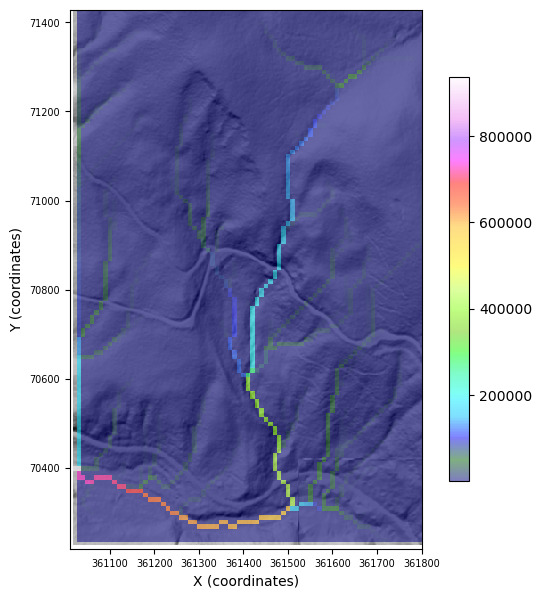

In [13]:
plot_node_field_with_shaded_high_res_dem(
    mg=mg,
    mg_hs=mg_hs,
    field='drainage_area',
    cmap="gist_ncar",
    #cbr=[0, 1],
    fontsize=7,
)

Once the model has finished running, view an animation of the landslide runout, here shown as the DoD from each iteration of the model run. <br>

Preparation of runout animation is 102% complete

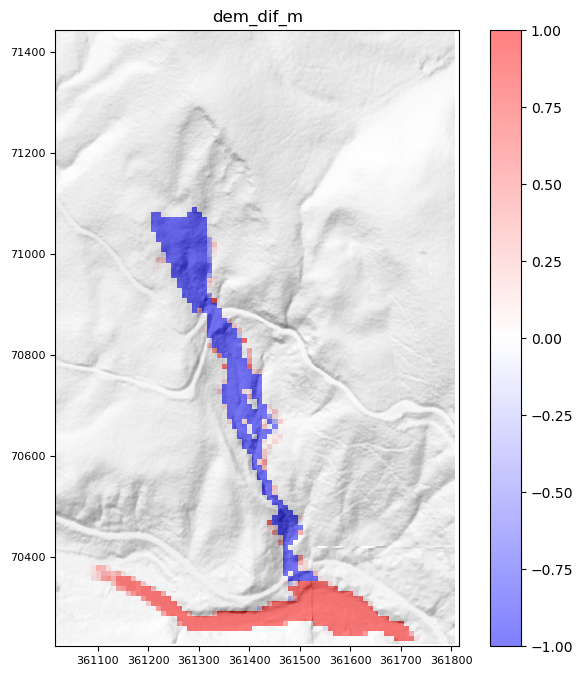

In [14]:
plot_interval = 5 # plot every plot_interval-th frame - note if interval is too short, 
# animation may not include the entire modeled output



def update_plot(frame_number, MWR, plot):
    mg.at_node["dem_dif_m"] = (
        MWR.saver.runout_evo_maps[0][frame_number]
        - mg.at_node["topographic__initial_elevation"]
    )
    plot[0].set_array(mg.at_node["dem_dif_m"])
    plot[0].remove()
    plot[0] = color_mesh_vals(clim=[-1, 1])
    print(f"\rPreparation of runout animation is {int(100*frame_number/(nmax-plot_interval+1))}% complete", end="")
    return plot

# prepare the first frame
fig = plt.figure(figsize=(8, 8))
nmax = len(MWR.saver.runout_evo_maps[0].keys())
x, y, values = get_values_xy(mg_hs, "hillshade_arc")
myimage = plt.pcolormesh(x, y, values, cmap="Greys_r", alpha=1)
myimage.set_rasterized(True)
myimage.axes.set_aspect("equal")
plt.autoscale(tight=True)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plot = [color_mesh_vals(clim=[-1, 1])]
plt.title("dem_dif_m")
cb = plt.colorbar(norm=True)

animate_10 = animation.FuncAnimation(
    fig,
    update_plot,
    np.arange(0,nmax,plot_interval),
    fargs=(MWR, plot),
    blit=True,
    repeat=True,
    cache_frame_data=False,
    interval = 200
)

HTML(animate_10.to_jshtml())

In [15]:
E_mask = mg.at_node["dem_dif_m"]<0
E_area = E_mask.sum()*mg.dx*mg.dy
E_mean = mg.at_node["dem_dif_m"][E_mask].mean()
A_mask = mg.at_node["dem_dif_m"]>0
A_area = A_mask.sum()*mg.dx*mg.dy
A_mean = mg.at_node["dem_dif_m"][A_mask].mean()

print('Modeled mean erosion depth of {} m over an area of {} m^2 and a total erosion volume of {} m^3'.format(np.round(E_mean, decimals = 2), E_area, np.round(E_mean*E_area, decimals = 2)))
print('Modeled mean aggradation depth of {} m over an area of {} m^2 and a total aggradation volume of {} m^3'.format(np.round(A_mean,decimals = 2), A_area, np.round(A_mean*A_area, decimals = 2)))

Modeled mean erosion depth of -2.48 m over an area of 41900.0 m^2 and a total erosion volume of -104110.35 m^3
Modeled mean aggradation depth of 2.39 m over an area of 43600.0 m^2 and a total aggradation volume of 104110.35 m^3


**Lets take a look at how the landslide modified the slope-area charactersitics of the model domain**

In [16]:
# delete multiflow direction so d8 direction can be run to get steepest slope at each node
mg.delete_field(loc="node", name="flow__sink_flag")
mg.delete_field(loc="node", name="flow__link_to_receiver_node")
mg.delete_field(loc="node", name="flow__receiver_node")
mg.delete_field(loc="node", name="topographic__steepest_slope")

fa = FlowAccumulator(mg, "topographic__elevation", flow_director="FlowDirectorD8")
fa.run_one_step()

a_p = mg.at_node['drainage_area'][mg.core_nodes]
s_p = mg.at_node['topographic__steepest_slope'][mg.core_nodes]

In [17]:
def get_mean_area_and_slope(a,s):
    """a - contributing area; s - slope"""
    A = a[(s>10e-8)] # get rid of flat or nearly flat points
    S = s[(s>10e-8)]
    MnArea = []
    MnSlope = []
    lgx = np.logspace(1,9,66) #definelog-scaled bins
    for c,v in enumerate(lgx[0:-1]): # for each bin, get the mean value
        areabin = (A>=lgx[c]) & (A<lgx[c+1])
        MnArea.append((lgx[c]+lgx[c+1])/2)
        MnSlope.append(S[areabin].mean())
    return MnArea, MnSlope, A, S

C:\Users\keckje\AppData\Local\Temp\ipykernel_31956\1352071409.py:11: RuntimeWarning: Mean of empty slice.
  MnSlope.append(S[areabin].mean())
C:\ProgramData\miniconda3\envs\landlab_dev\Lib\site-packages\numpy\_core\_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


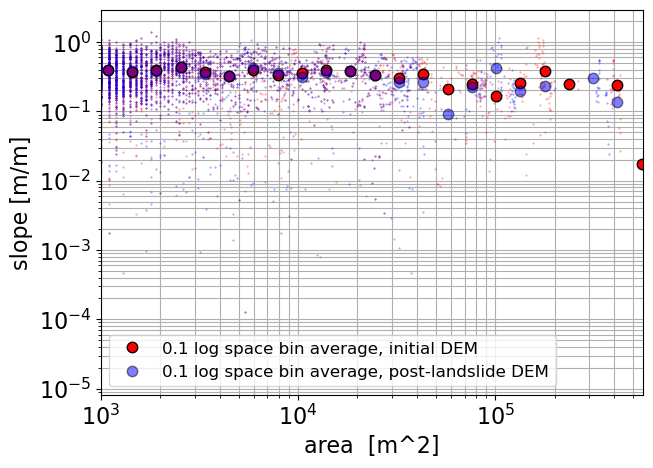

In [18]:
MnArea_i, MnSlope_i, A_i, S_i = get_mean_area_and_slope(a_i,s_i) # initial dem
MnArea_p, MnSlope_p, A_p, S_p = get_mean_area_and_slope(a_p,s_p) # post-landslide dem

fig, ax = plt.subplots(figsize=(7, 5))
plt.loglog(A_i, S_i, '.r',markersize = 0.75,alpha=.5)
plt.loglog(A_p, S_p, '.',color = 'blue', markersize = 0.75,alpha=.5)
plt.loglog(MnArea_i, MnSlope_i, '.r',markeredgecolor ='k',markersize = 15,label = '0.1 log space bin average, initial DEM')
plt.loglog(MnArea_p, MnSlope_p, '.b',markeredgecolor ='k',alpha = 0.5, markersize = 15,label = '0.1 log space bin average, post-landslide DEM')
plt.xlabel('area  [m^2]',fontsize=16)
plt.ylabel('slope [m/m]',fontsize=16)
plt.xlim([10e2,max(A_p)*1.5])
plt.tick_params(labelsize=16)
plt.grid(which='both')
plt.legend(fontsize=12)
plt.show()

**Now that you've seen an example of how a calibrated MWR can replicate observed runout, try re-running this notebook with different parameter values to see if you can send more sediment into the river valley below the second road crossing!**